# Agglomeration

##  Get agglomerations

In [1]:
from popframe.models.region import Region
region_model = Region.from_pickle('data/1.pickle')

In [11]:

from popframe.method.aglomeration import AgglomerationBuilder

agglomeration_builder = AgglomerationBuilder(region=region_model)
final_agglomerations = agglomeration_builder.get_agglomerations(time = 80)
final_agglomerations

,type,core_cities,population,agglomeration_level,geometry
0,Polycentric,"Всеволожск, Гатчина, Отрадное, Бугры, Никольск...",1116875,4,"POLYGON ((310261.047 6587674.368, 310046.437 6..."
1,Polycentric,"Светогорск, Выборг",129217,1,"POLYGON ((264064.801 6702843.886, 263672.547 6..."
2,Monocentric,Сосновый бор,90865,1,"POLYGON ((267829.075 6613610.384, 267754.034 6..."
3,Polycentric,"Бокситогорск, Тихвин, Пикалево",105381,1,"POLYGON ((535225.286 6582852.229, 535504.813 6..."
4,Polycentric,"Кириши, Волхов",102494,1,"POLYGON ((421196.961 6582742.806, 421196.513 6..."
5,Polycentric,"Сланцы, Кингисепп",115479,1,"POLYGON ((206722.793 6553056.587, 206615.98 65..."
6,Monocentric,Луга,58784,1,"POLYGON ((306605.524 6486633.39, 306526.354 64..."
7,Polycentric,"Подпорожье, Лодейное Поле",44609,1,"POLYGON ((513102.444 6711145.664, 512912.14 67..."
8,Monocentric,Приозерск,30441,1,"POLYGON ((337963.013 6743785.69, 337736.871 67..."


In [12]:
final_agglomerations.explore()

## Build circle frame

In [7]:
from popframe.method.popuation_frame import PopulationFrame
frame_method = PopulationFrame(region=region_model)
output = frame_method.build_circle_frame() 
output

,id,name,population,level,geometry
207,207,Болото,10,Малое сельское поселение,"POLYGON ((543177.545 6580637.216, 543177.376 6..."
208,208,Большой Остров,68,Малое сельское поселение,"POLYGON ((544624.73 6593227.683, 544624.288 65..."
209,209,Бор,1734,Большое сельское поселение,"POLYGON ((545358.957 6593052.346, 545356.725 6..."
210,210,Бороватое,10,Малое сельское поселение,"POLYGON ((544028.318 6589581.591, 544028.148 6..."
211,211,Бочево,10,Малое сельское поселение,"POLYGON ((538575.316 6576793.156, 538575.147 6..."
...,...,...,...,...,...
3133,3133,Апраксин Бор,313,Среднее сельское поселение,"POLYGON ((399256.679 6560340.947, 399255.73 65..."
3134,3134,Александровка,313,Среднее сельское поселение,"POLYGON ((404164.108 6562086.557, 404163.159 6..."
3135,3135,Большая Горка,313,Среднее сельское поселение,"POLYGON ((413313.678 6573792.753, 413312.73 65..."
3136,3136,Дроздово,5,Малое сельское поселение,"POLYGON ((412482.916 6574810.78, 412482.796 65..."


In [6]:
final_agglomerations.to_file("final_agglomerations.geojson", driver="GeoJSON")

## Evaluate city agglomeration status

In [8]:
towns_with_status = agglomeration_builder.evaluate_city_agglomeration_status(output, final_agglomerations)
towns_with_status

,id,name,population,level,geometry,agglomeration_status,agglomeration_level
207,207,Болото,10,Малое сельское поселение,"POLYGON ((543177.545 6580637.216, 543177.376 6...",В агломерации,1
208,208,Большой Остров,68,Малое сельское поселение,"POLYGON ((544624.73 6593227.683, 544624.288 65...",В агломерации,1
209,209,Бор,1734,Большое сельское поселение,"POLYGON ((545358.957 6593052.346, 545356.725 6...",В агломерации,1
210,210,Бороватое,10,Малое сельское поселение,"POLYGON ((544028.318 6589581.591, 544028.148 6...",В агломерации,1
211,211,Бочево,10,Малое сельское поселение,"POLYGON ((538575.316 6576793.156, 538575.147 6...",Вне агломерации,0
...,...,...,...,...,...,...,...
3133,3133,Апраксин Бор,313,Среднее сельское поселение,"POLYGON ((399256.679 6560340.947, 399255.73 65...",Вне агломерации,0
3134,3134,Александровка,313,Среднее сельское поселение,"POLYGON ((404164.108 6562086.557, 404163.159 6...",Вне агломерации,0
3135,3135,Большая Горка,313,Среднее сельское поселение,"POLYGON ((413313.678 6573792.753, 413312.73 65...",Вне агломерации,0
3136,3136,Дроздово,5,Малое сельское поселение,"POLYGON ((412482.916 6574810.78, 412482.796 65...",Вне агломерации,0


In [ ]:
# towns_with_status.to_file("towns_with_status.geojson", driver="GeoJSON")

/var/folders/h8/0wmx2zx90bn60jw8zc1r4qjc0000gn/T/ipykernel_1532/1785706060.py:42: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  subset.plot(ax=ax, color=color, edgecolor='black')
/var/folders/h8/0wmx2zx90bn60jw8zc1r4qjc0000gn/T/ipykernel_1532/1785706060.py:42: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  subset.plot(ax=ax, color=color, edgecolor='black')
/var/folders/h8/0wmx2zx90bn60jw8zc1r4qjc0000gn/T/ipykernel_1532/1785706060.py:47: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  subset.plot(ax=ax, marker='o', color=color, markersize=10, edgecolor='black')


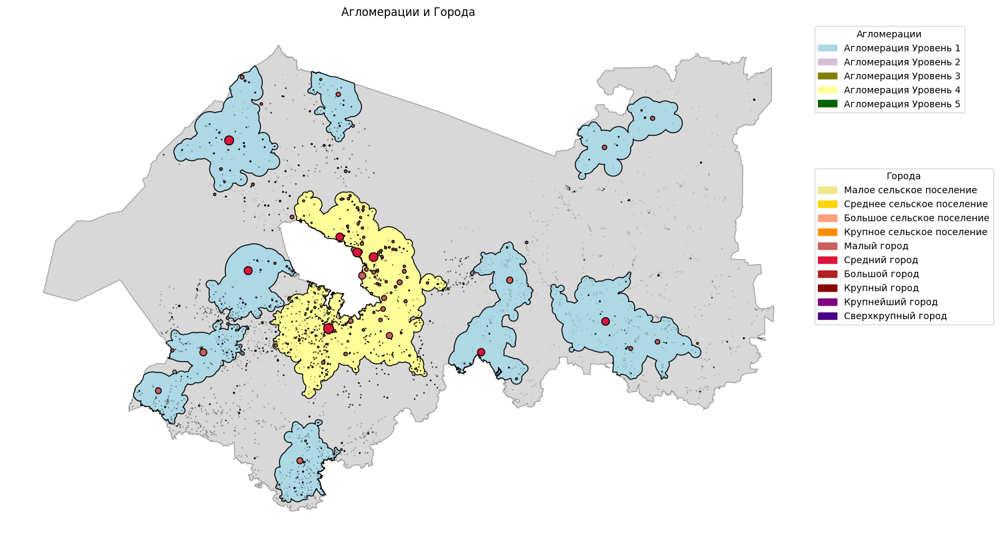

In [13]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Ваши цвета для агломераций
agglomeration_colors = {
    1: "#ADD8E6",  # светло-голубой
    2: "#D8BFD8",  # светло-фиолетовый
    3: "#808000",  # оливковый
    4: "#FFFF99",  # светло-желтый
    5: "#006400"   # темно-зеленый
}

# Ваши цвета для городов
city_colors = {
    "Малое сельское поселение": "#F0E68C",  # бледно-желтый
    "Среднее сельское поселение": "#FFD700",  # золотисто-желтый
    "Большое сельское поселение": "#FFA07A",  # светло-лососевый
    "Крупное сельское поселение": "#FF8C00",  # темно-оранжевый
    "Малый город": "#CD5C5C",                 # красно-коричневый
    "Средний город": "#DC143C",               # красный кармин
    "Большой город": "#B22222",               # огненно-красный
    "Крупный город": "#8B0000",               # темно-красный
    "Крупнейший город": "#800080",            # фиолетовый
    "Сверхкрупный город": "#4B0082"           # индиго
}

# Чтение агломераций и городов из GeoDataFrame
gdf_agglomerations = final_agglomerations
gdf_cities = output
region_boundary = region_model.region  # Ваши границы региона

# Создание подложки для карты
fig, ax = plt.subplots(figsize=(20, 10))

# Визуализация границ региона (серым цветом с прозрачностью)
region_boundary.plot(ax=ax, color='gray', edgecolor='black', alpha=0.3)

# Визуализация агломераций
for level, color in agglomeration_colors.items():
    subset = gdf_agglomerations[gdf_agglomerations['agglomeration_level'] == level]
    subset.plot(ax=ax, color=color, edgecolor='black')

# Визуализация городов с различными цветами
for city_type, color in city_colors.items():
    subset = gdf_cities[gdf_cities['level'] == city_type]
    subset.plot(ax=ax, marker='o', color=color, markersize=10, edgecolor='black')

# Создание легенды для агломераций
agglomeration_patches = [mpatches.Patch(color=color, label=f'Агломерация Уровень {level}') 
                         for level, color in agglomeration_colors.items()]

# Создание легенды для городов
city_patches = [mpatches.Patch(color=color, label=city_type) 
                for city_type, color in city_colors.items()]

# Отображение легенды для агломераций
legend_agglomeration = plt.legend(handles=agglomeration_patches, loc='upper left', bbox_to_anchor=(1, 1), title="Агломерации")
ax.add_artist(legend_agglomeration)  # Добавление первой легенды

# Отображение легенды для городов
plt.legend(handles=city_patches, loc='lower left', bbox_to_anchor=(1, 0.4), title="Города")

# Настройка осей
plt.title("Агломерации и Города")
ax.set_axis_off()

# Показать карту
plt.show()

In [10]:
unique_count = towns_with_status['agglomeration_status'].value_counts()
unique_count

Вне агломерации      1986
В агломерации         915
Центр агломерации      30
Name: agglomeration_status, dtype: int64

In [10]:
# Визуализируем первый GeoDataFrame
m = final_agglomerations.explore()

# Добавляем второй GeoDataFrame на ту же карту
towns_with_status.explore(m=m)


## Scenario

In [11]:
from popframe.models.region import Region

region_model = Region.from_pickle('data/Ленинградская область.pickle')

from popframe.method.aglomeration import AgglomerationBuilder

agglomeration_builder = AgglomerationBuilder(region=region_model)


In [12]:
import pandas as pd
# update = {
#     630: {
#         'population': 300_000,
#     },
#     259: {
#         'population': 150_000,
#     }
# }

update = {
  2618: {
    'population': 500_000,
  }
}
update_df = pd.DataFrame.from_dict(update, orient='index')

In [13]:
final_agglomerations = agglomeration_builder.get_agglomerations(update_df)
final_agglomerations

,type,core_cities,population,agglomeration_level,geometry
0,Polycentric,"Волхов, Бокситогорск, Кириши, Тихвин, Пикалево",656824,3,"POLYGON ((421196.961 6582742.806, 421196.513 6..."
1,Polycentric,"Всеволожск, Кудрово, Новое Девяткино, Кировск,...",1116875,4,"POLYGON ((310261.047 6587674.368, 310046.437 6..."
2,Polycentric,"Выборг, Светогорск",129217,1,"POLYGON ((264064.801 6702843.886, 263672.547 6..."
3,Polycentric,"Сланцы, Кингисепп",115479,1,"POLYGON ((206722.793 6553056.587, 206615.98 65..."
4,Monocentric,Луга,58784,1,"POLYGON ((306605.524 6486633.39, 306526.354 64..."
5,Polycentric,"Лодейное Поле, Подпорожье",44609,1,"POLYGON ((513102.444 6711145.664, 512912.14 67..."
6,Monocentric,Приозерск,30441,1,"POLYGON ((337963.013 6743785.69, 337736.871 67..."


In [14]:
from popframe.method.popuation_frame import PopulationFrame
frame_method = PopulationFrame(region=region_model)
output = frame_method.build_circle_frame(update_df) 
output

,geometry,id,name,population,level
0,"POLYGON ((543177.545 6580637.216, 543177.376 6...",0,Болото,10,Малое сельское поселение
1,"POLYGON ((544624.73 6593227.683, 544624.288 65...",1,Большой Остров,68,Малое сельское поселение
2,"POLYGON ((545358.957 6593052.346, 545356.725 6...",2,Бор,1734,Большое сельское поселение
3,"POLYGON ((544028.318 6589581.591, 544028.148 6...",3,Бороватое,10,Малое сельское поселение
4,"POLYGON ((538575.316 6576793.156, 538575.147 6...",4,Бочево,10,Малое сельское поселение
...,...,...,...,...,...
2925,"POLYGON ((399256.679 6560340.947, 399255.73 65...",2925,Апраксин Бор,313,Среднее сельское поселение
2926,"POLYGON ((404164.108 6562086.557, 404163.159 6...",2926,Александровка,313,Среднее сельское поселение
2927,"POLYGON ((413313.678 6573792.753, 413312.73 65...",2927,Большая Горка,313,Среднее сельское поселение
2928,"POLYGON ((412482.916 6574810.78, 412482.796 65...",2928,Дроздово,5,Малое сельское поселение


/var/folders/h8/0wmx2zx90bn60jw8zc1r4qjc0000gn/T/ipykernel_3334/2725489271.py:42: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  subset.plot(ax=ax, color=color, edgecolor='black')
/var/folders/h8/0wmx2zx90bn60jw8zc1r4qjc0000gn/T/ipykernel_3334/2725489271.py:42: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  subset.plot(ax=ax, color=color, edgecolor='black')
/var/folders/h8/0wmx2zx90bn60jw8zc1r4qjc0000gn/T/ipykernel_3334/2725489271.py:47: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  subset.plot(ax=ax, marker='o', color=color, markersize=10, edgecolor='black')
/var/folders/h8/0wmx2zx90bn60jw8zc1r4qjc0000gn/T/ipykernel_3334/2725489271.py:47: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  subset.plot(ax=ax, marker='o', color=color, markersize=10, edgecolor='black')


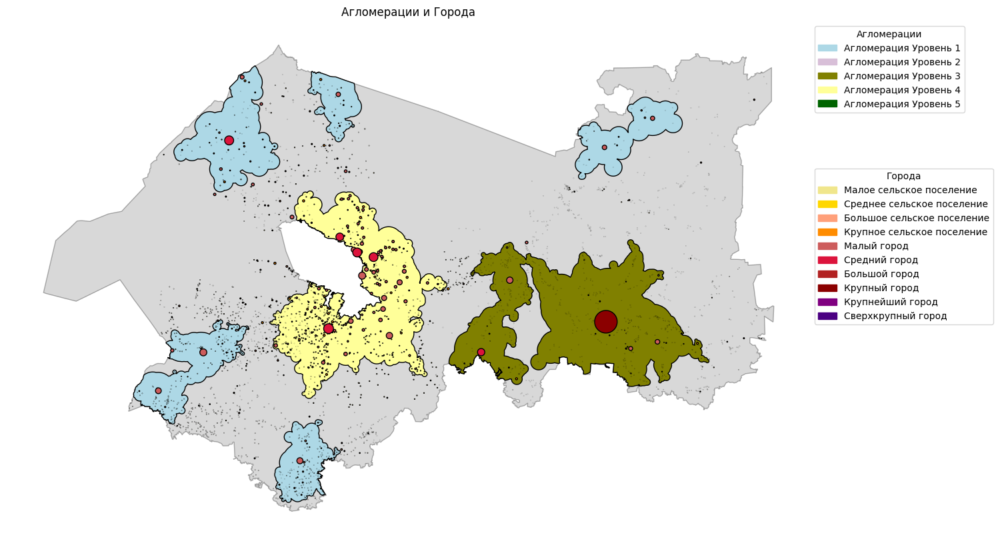

In [15]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Ваши цвета для агломераций
agglomeration_colors = {
    1: "#ADD8E6",  # светло-голубой
    2: "#D8BFD8",  # светло-фиолетовый
    3: "#808000",  # оливковый
    4: "#FFFF99",  # светло-желтый
    5: "#006400"   # темно-зеленый
}

# Ваши цвета для городов
city_colors = {
    "Малое сельское поселение": "#F0E68C",  # бледно-желтый
    "Среднее сельское поселение": "#FFD700",  # золотисто-желтый
    "Большое сельское поселение": "#FFA07A",  # светло-лососевый
    "Крупное сельское поселение": "#FF8C00",  # темно-оранжевый
    "Малый город": "#CD5C5C",                 # красно-коричневый
    "Средний город": "#DC143C",               # красный кармин
    "Большой город": "#B22222",               # огненно-красный
    "Крупный город": "#8B0000",               # темно-красный
    "Крупнейший город": "#800080",            # фиолетовый
    "Сверхкрупный город": "#4B0082"           # индиго
}

# Чтение агломераций и городов из GeoDataFrame
gdf_agglomerations = final_agglomerations
gdf_cities = output
region_boundary = region_model.region  # Ваши границы региона

# Создание подложки для карты
fig, ax = plt.subplots(figsize=(20, 10))

# Визуализация границ региона (серым цветом с прозрачностью)
region_boundary.plot(ax=ax, color='gray', edgecolor='black', alpha=0.3)

# Визуализация агломераций
for level, color in agglomeration_colors.items():
    subset = gdf_agglomerations[gdf_agglomerations['agglomeration_level'] == level]
    subset.plot(ax=ax, color=color, edgecolor='black')

# Визуализация городов с различными цветами
for city_type, color in city_colors.items():
    subset = gdf_cities[gdf_cities['level'] == city_type]
    subset.plot(ax=ax, marker='o', color=color, markersize=10, edgecolor='black')

# Создание легенды для агломераций
agglomeration_patches = [mpatches.Patch(color=color, label=f'Агломерация Уровень {level}') 
                         for level, color in agglomeration_colors.items()]

# Создание легенды для городов
city_patches = [mpatches.Patch(color=color, label=city_type) 
                for city_type, color in city_colors.items()]

# Отображение легенды для агломераций
legend_agglomeration = plt.legend(handles=agglomeration_patches, loc='upper left', bbox_to_anchor=(1, 1), title="Агломерации")
ax.add_artist(legend_agglomeration)  # Добавление первой легенды

# Отображение легенды для городов
plt.legend(handles=city_patches, loc='lower left', bbox_to_anchor=(1, 0.4), title="Города")

# Настройка осей
plt.title("Агломерации и Города")
ax.set_axis_off()

# Показать карту
plt.show()

